In [21]:
from pylab import *
import skimage
import numpy as np
from skimage import util
from scipy import ndimage
from skimage import restoration
import scipy.io
import time

# 1. Zadatak
Slika girl_ht.tif je nastala postupkom polutoniranja gde se štampanjem 
crnih i belih polja različite veličine ostvaruje utisak različitih nijansi sive. 
Potrebno je poboljšati kvalitet ove slike tako da se dobije uniformna slika i da 
se što više potisnu tragovi tačkica.

In [2]:
# Definicija low pass filtra u frekvencijskom domenu

def lpfilter(filt_type, Ny, Nx, sigma, n=1):
    # Opis funkcije
    # Ny,Nx - dimenzije filtra
    # sigma - standardna devijacija filtra
    # n - red filtra



    # pravljenje 2d grid-a, koordinatni centrar se nalazi u centru matrice

    if (Ny%2 == 0):
        y = np.arange(0,Ny) - Ny/2 + 0.5
    else:
        y = np.arange(0,Ny) - (Ny-1)/2
    
    if (Nx%2 == 0):
        x = np.arange(0,Nx) - Nx/2 + 0.5
    else:
        x = np.arange(0,Nx) - (Nx-1)/2
    X, Y = meshgrid(x, y)

    D = np.sqrt(np.square(X) + np.square(Y))

    # U zavisnosti od prosleđenog argumenta za tip filtera pravi se gausov, batervortov ili idealni filtar
    if filt_type == 'gaussian':
        filter_mask = exp(-np.square(D)/(2*np.square(sigma)))
    elif filt_type == 'btw':
        filter_mask = 1/(1+(D/sigma)**(2*n))
    elif filt_type == 'ideal':
        filter_mask = ones([Ny, Nx])
        filter_mask[D>sigma] = 0
    else:
        print('Greška! Nije podržan tip filtra: ', filt_type)
        return
    
    return filter_mask

# Postupak filtracije u frekvencijskom domenu:

1. Ulazna slika se proširuje nulama da bi se izbegle greške cirkularnosti konvolucije
2. Furijeova transformacija i centriranje spektra
3. Definisanje filtarske maske
4. Spektar filtrirane slike se dobija kao proizvod maske i ulazne slike
5. Inverzna Furijeova transformacija filtrirane slike
6. Uklanje nula kojima je slika proširena na početku

In [3]:
# Učitavanje slike i proširivanje nulama

img = skimage.img_as_float(imread('sekvence/girl_ht.tif'))
[Nx,Ny] = shape(img)
Px = 2*Nx-1; Py = 2*Ny-1;
img_pad = np.zeros((Px,Py))
img_pad[0:Nx,0:Ny] = img;

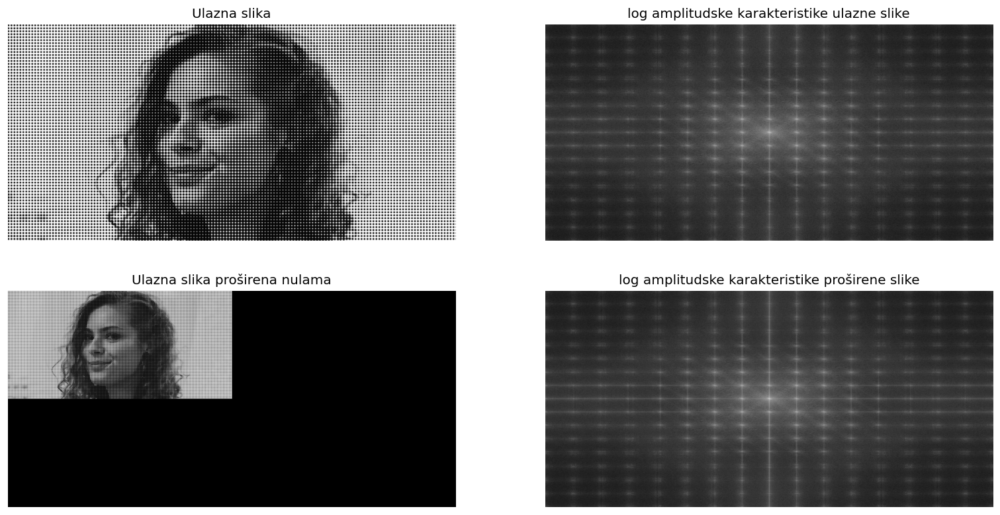

In [4]:
# Furijeova transformacija ulazne slike i proširene slike i centriranje njihovog spektra

img_fft = fftshift(fft2(img))
img_fft_pad = fftshift(fft2(img_pad))

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16,8), dpi=120)
ax = axes.ravel()

ax[0].imshow(img, cmap='gray'); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika')
ax[1].imshow(log(1+abs(img_fft)), cmap='gray'); ax[1].set_axis_off(); ax[1].set_title('log amplitudske karakteristike ulazne slike');
ax[2].imshow(img_pad, cmap='gray'); ax[2].set_axis_off(); ax[2].set_title('Ulazna slika proširena nulama')
ax[3].imshow(log(1+abs(img_fft_pad)), cmap='gray'); ax[3].set_axis_off(); ax[3].set_title('log amplitudske karakteristike proširene slike');

Spektar proširene i ulazne slike bi bili isti kada bi se iz proširene uzeo svaki drugi odbirak.

Sa amplitudske karakteristike se vidi da postoje smetnje i na visokim i na niskim učestanostima. Smetnje na visokim učestanostima ću ukloniti low pass filtrom, a na nižim učestanostima pomoću notch filtra.

In [5]:
def cnotch(filt_type, notch, Ny, Nx, C, r, n=1):
    # Opis funkcije
    #
    # Ulazni parametri:
    #
    # filt_type - tip filtra (Gausov, idealni, Batervortov)
    # notch - propusnik ili nepropusnik opsega
    # C - niz centara po kojim se radi filtriranje
    # r - standardna devijacija
    # n - red filtra
    #
    # Postupak:
    # pomoću meshgrid-a pravi se mreža u kojoj će da se smesti više filtara na različitim koordinatama. Iz ulaznog parametra C se prave filtri čije su srednje vrednosti
    # upravo ti prosleđeni centri i njihovi centralno simetrični parovi.
    # 
    N_filters = len(C)
    
    filter_mask = zeros([Ny,Nx])
    
    if (Ny%2 == 0): # Razoličite inicijalizacije meshgrid-a u zavisnosti od parnosti dimenzije slike
        y = np.arange(0,Ny) - Ny/2 + 0.5
    else:
        y = np.arange(0,Ny) - (Ny-1)/2
    
    if (Nx%2 == 0):
        x = np.arange(0,Nx) - Nx/2 + 0.5
    else:
        x = np.arange(0,Nx) - (Nx-1)/2

    X, Y = meshgrid(x, y)
    
    for i in range(0, N_filters): #racunanje centralno simetricnih komponenti
        C_current = C[i]
        C_complement = zeros([2,1])
        C_complement[0] = -C_current[0]
        C_complement[1] = -C_current[1]
        
        
        if (Ny%2 == 0):
            
            y0 = y - C_current[0] + Ny/2 - 0.5
        else:
            y0 = y - C_current[0] + (Ny-1)/2
        
        if (Nx%2 == 0):
            x0 = x - C_current[1] + Nx/2 - 0.5
        else:
            x0 = x - C_current[1] + (Nx-1)/2
        
        X0, Y0 = meshgrid(x0, y0)
        
        D0 = np.sqrt(np.square(X0) + np.square(Y0))
    
        if (Ny%2 == 0):
            y0c = y - C_complement[0] - Ny/2 + 0.5
        else:
            y0c = y - C_complement[0] - (Ny-1)/2
        
        if (Nx%2 == 0):
            x0c = x - C_complement[1] - Nx/2 + 0.5
        else:
            x0c = x - C_complement[1] - (Nx-1)/2
        
        X0c, Y0c = meshgrid(x0c, y0c)
        
        D0c = np.sqrt(np.square(X0c) + np.square(Y0c))
        if filt_type == 'gaussian':
            filter_mask = filter_mask + \
                          exp(-np.square(D0)/(2*np.square(r))) + \
                          exp(-np.square(D0c)/(2*np.square(r)))
        elif filt_type == 'btw':
            filter_mask = filter_mask + \
                          1/(1+(D0/r)**(2*n)) + \
                          1/(1+(D0c/r)**(2*n))
        elif filt_type == 'ideal':
            filter_mask[(D0<=r)|(D0c<=r)] = 1
        else:
            print('Greška! Nije podržan tip filtra: ', filt_type)
            return
    
    if notch == 'pass':
        return filter_mask
    elif notch == 'reject':
        return 1 - filter_mask
    else:
        return

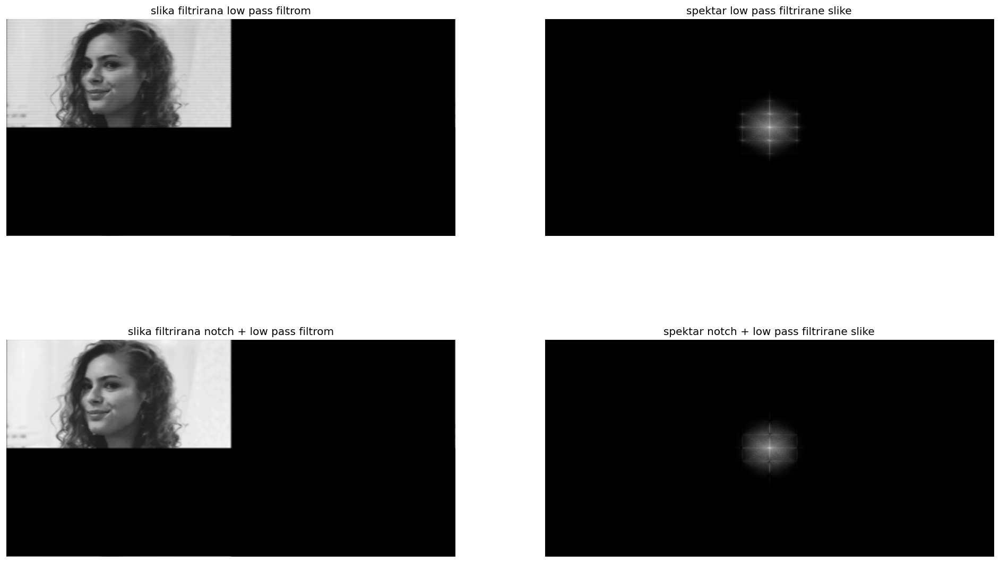

In [6]:
# Filtriranje slike

# Pravljenje Gausovog low pass filtra

filt_freq = lpfilter('gaussian', Px, Py, sigma=100)
img_fft_filt = img_fft_pad*filt_freq

# Inverzna Furijeova transformacija

img_filt = real(ifft2(ifftshift(img_fft_filt)))
img_filt = np.clip(img_filt, 0, 1)

# Niz centara smetnji za notch filtar
C = [[1050, 2480],[1050,2170],[1050,2790],[900, 2480],[900,2170],[900,2790],[1200,2790]]

# Prvaljenje notch filtar maske
nr_filter_freq = cnotch('gaussian', 'reject', Px, Py, C, 40)

# Filtriranje slike
img_fft_notch = img_fft_filt*nr_filter_freq

img_filt_notch = real(ifft2(ifftshift(img_fft_notch)))
img_filt_notch = np.clip(img_filt_notch, 0, 1)

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20,12), dpi=120)
ax = axes.ravel()

ax[0].imshow(img_filt, cmap='gray'); ax[0].set_axis_off(); ax[0].set_title('slika filtrirana low pass filtrom');
ax[1].imshow(log(1+abs(img_fft_filt)), cmap='gray'); ax[1].set_axis_off(); ax[1].set_title('spektar low pass filtrirane slike');
ax[2].imshow(img_filt_notch, cmap='gray'); ax[2].set_axis_off(); ax[2].set_title('slika filtrirana notch + low pass filtrom');
ax[3].imshow(log(1+abs(img_fft_notch)), cmap='gray'); ax[3].set_axis_off(); ax[3].set_title('spektar notch + low pass filtrirane slike');


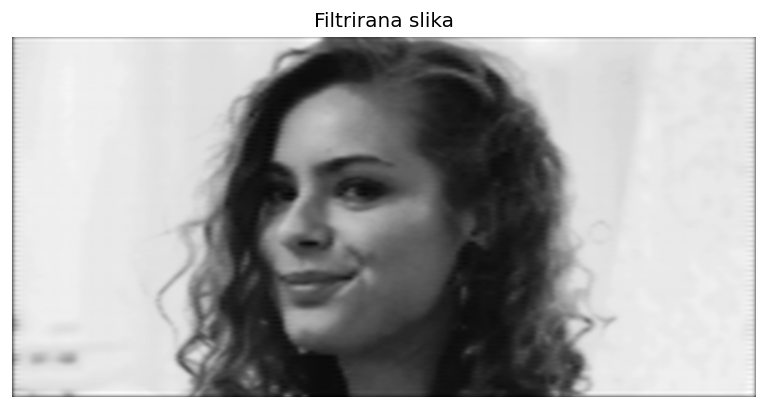

In [7]:
# Uklanjanje nula sa početka

[Nx,Ny] = shape(img)
img_out = img_filt_notch[0:Nx,0:Ny]
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(8,8), dpi=120)
axes.imshow(img_out, cmap='gray'); axes.set_axis_off(); axes.set_title('Filtrirana slika');


Sa tri strane slike, pojavljuje se crna linija usled dodavanja nula u prvom koraku i cirkularne konvolucije, ali bitan deo slike je postavo uniforminiji i više nema drastične prelaze iz crne u belu.

# 2. Zadatak
Slika lena_noise.tif sadrži određenu količinu Gausovog šuma nepoznate 
varijanse. Potisnuti šum sa ove slike korišćenjem adaptivnog filtriranja.
Varijansu šuma proceniti direktno iz zašumljene slike. Primeniti bilateralni 
filtar u cilju uklanjanja šuma. Odrediti parametre da se dobije što bolji rezultat.
Komentarisati način izbora parametara. Uporediti rezultat sa rezultatom 
adaptivnog filtriranja.

Adapivno usrednjavanje:
Samo aritmetičko usrednjavanje slike dobro otklanja Gausov šum na uniformnim regionima, ali na mestima gde postoje izvice dolazi do njihovog znatnog zamućenja. Iz tog razloga potrebno je definisati težinsku funkciju koja će da ima veliku vrednost na regionim gde je lokalna varijansa manje od ukupne varijanse šuma, tj. na uniformnim regionima, a na mestima gde je lokalna varijansa veca od ukupne varijanse tj. na ivicama, imaće malu vrednost. Ako se izlazna slika definiše kao f = (1-w)*g + w*k gde su: 

w - težinska funkcija

g - ulazna slika sa šumom

k - aritmetički usrednjena slika

f - izlazna slika

dobijamo na izlazu sliku koja je na uniformnijim regionima više slična aritmetički usrednjenoj slici, a na ivicama više slična početnoj slici. Time dobijamo da su ivice više izražene nego sa samim usrednjavanjem. Loša strana ovoga je što na ivicama šum nije uklonjen i on se dodaje na krajnju sliku.

0.08395355741631345


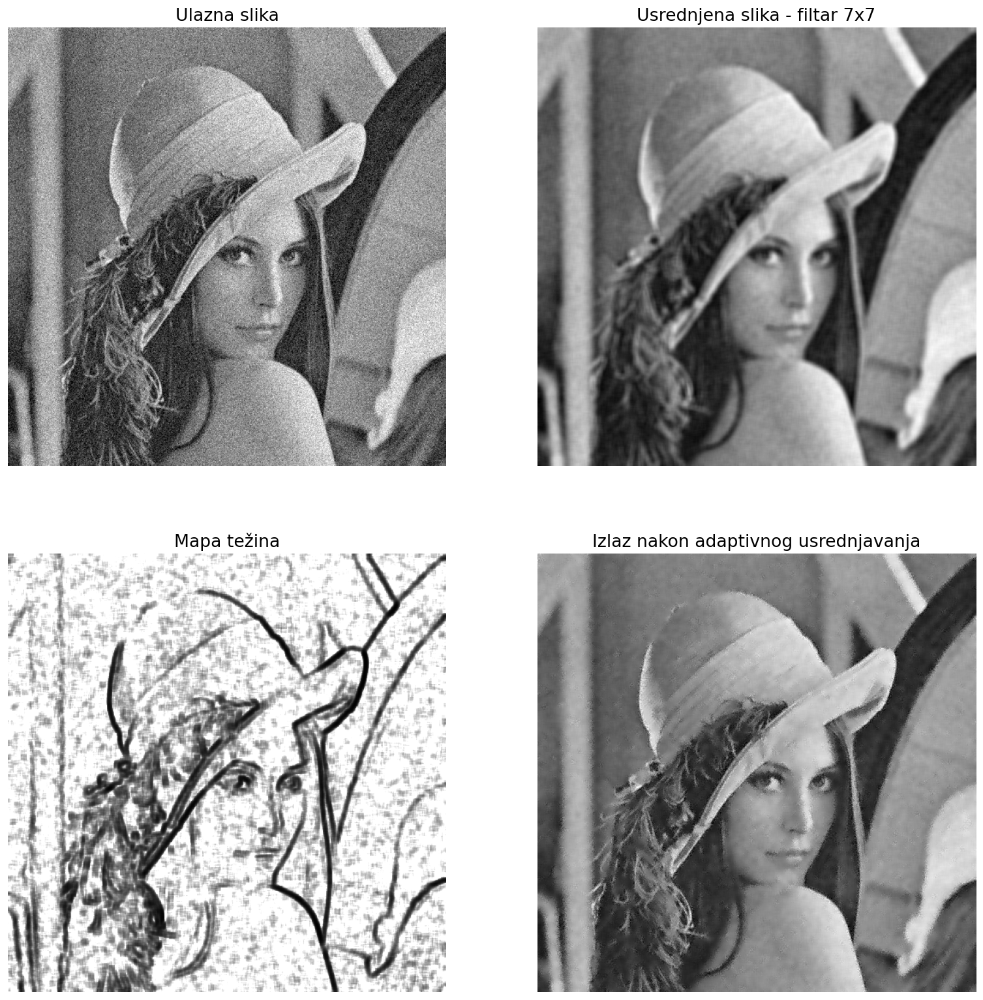

In [8]:
# Učitavanje slike i računanje ukupne varijanse šuma
img = util.img_as_float(imread('sekvence/lena_noise.tif'))
sigma_est = restoration.estimate_sigma(img)
variance_est = sigma_est**2
print(sigma_est)

# Aritmetičko usrednjavanje i računanje lokalne varijanse
filt_avg = ones([7,7])/(7**2)
img_local_avg = ndimage.correlate(img, filt_avg)
img_sqr_local_avg = ndimage.correlate(img**2, filt_avg)
img_local_var = img_sqr_local_avg - img_local_avg**2


# Računanje težinske funkcije
weight = variance_est/img_local_var
weight[weight>1]=1

# Adaptivno usrednjavanje
img_est = img + weight*(img_local_avg-img)

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16,16), dpi=120)
ax = axes.ravel()

ax[0].imshow(img, cmap='gray'); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika',fontsize=16)
ax[1].imshow(img_local_avg, cmap='gray'); ax[1].set_axis_off(); ax[1].set_title('Usrednjena slika - filtar 7x7',fontsize=16)
ax[2].imshow(weight, cmap='gray'); ax[2].set_axis_off(); ax[2].set_title('Mapa težina',fontsize=16)
ax[3].imshow(img_est, cmap='gray'); ax[3].set_axis_off(); ax[3].set_title('Izlaz nakon adaptivnog usrednjavanja',fontsize=16);

# Bilateralni filtar

Bilateralni filtar rešava problem zamućenja ivica tako što pored težinske funkcije koja zavisti od prostorne udaljenosti piksela od centra maske, sadrži i težinsku funkciju koja predstavlja udaljenost vrednosti piksela u masci od vrednosti centralnog piksela. Postoje argumenti funkcije koji penalizuju više prostornu udaljenost ili vrednosnu udaljenost i njihovim menjanjem dobijamo različite rezultate pri filtriranju. Promena parametra sigmaS utiče na lokalnost filtriranja. Sa manjim sigmaS uzeće se u obzir manji prostorni opseg, a sa većim veći. Manji sigmaR čuva finije detalje, a veće pravi glatke prelaze.

Text(0.5, 1.0, 'bilateralni filtar')

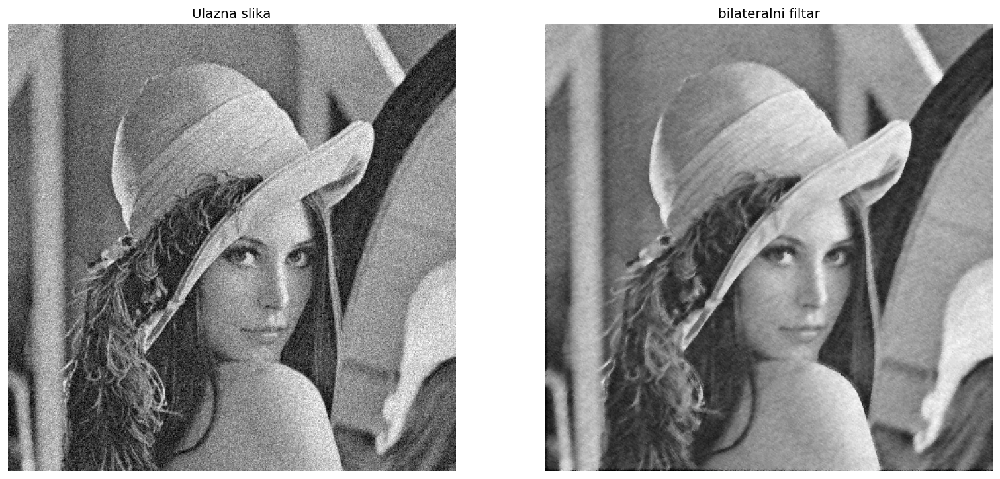

In [9]:
img_bil = restoration.denoise_bilateral(img,sigma_color=0.2,sigma_spatial=1)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,16), dpi=120)
ax = axes.ravel()

ax[0].imshow(img, cmap='gray'); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika')
ax[1].imshow(img_bil, cmap='gray'); ax[1].set_axis_off(); ax[1].set_title('bilateralni filtar')

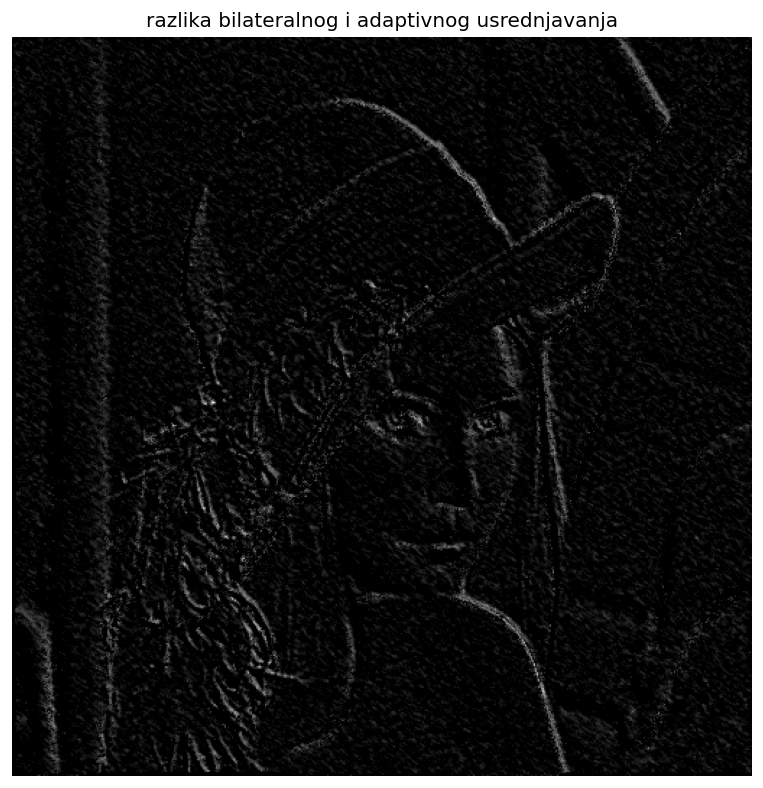

In [10]:
razlika = img_bil-img_est
razlika = np.clip(razlika,0,1)
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(8,8), dpi=120)


axes.imshow(razlika, cmap='gray'); axes.set_axis_off(); axes.set_title('razlika bilateralnog i adaptivnog usrednjavanja');

# Zaključak

Bilateralni filtar bolje čuva ivice ali adaptivno filtriranje vrši veće potiskivanje šuma

# 3. Zadatak
Prilikom obilaska Beograda turističkim autobusom Pera Perić je 
telefonom fotografisao razne znamenitosti. Prilikom prolaska pored zgrade 
Elektrotehničkog fakulteta autobus je upao u rupu na putu i upropastio Peri 
sliku. Pošto je pretpostavljao da se ovako nešto može desiti u Beogradu, Pera 
je podesio žiroskop i akcelerometar da snimaju pokrete telefona kako bi 
mogao kasnije da se pozabavi problematičnim snimcima. Snimak pokreta 
kamere je prikazan na slici kernel.tif. Pomozite Peri da što bolje popravi 
kvalitet zamućene slike etf_blur.tif koristeći informacije o pokretima kamere 
u toku snimanja. Voditi računa da proces zamućenja slike ne menja srednju 
vrednost intenziteta slike.

Postupak kojim se ovaj zadatak može rešiti je inverzno filtriranje i Vinerov filtar.

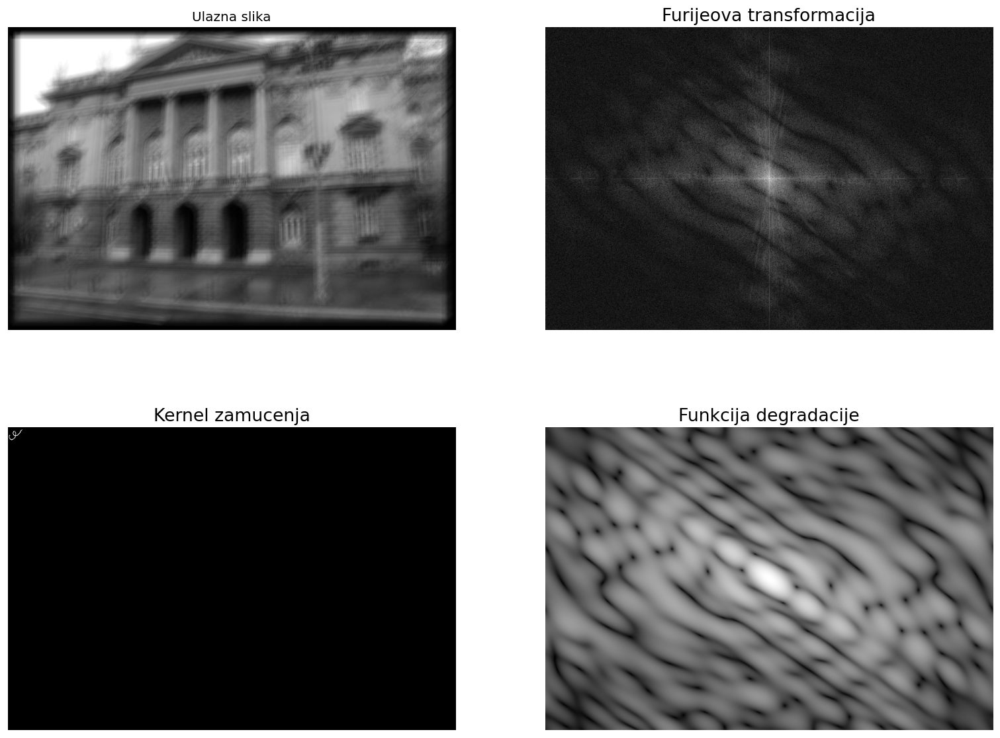

In [11]:
# Učitavanje slike i pronalazak Furijeove transformacije slike i kernela zamucenja
img = util.img_as_float(imread('sekvence/etf_blur.tif'))
kernel = util.img_as_float(imread('sekvence/kernel.tif'))
kernel_fft = fftshift(fft2(kernel))
[Ny, Nx] = shape(img)
kernel_padded = zeros([Ny,Nx]) # Proširenje kernela nulama da bi njegova furijeova transformacija bila iste dimenzije kao slika
kernel_padded[0:30,0:30] = kernel
kernel_fft = fftshift(fft2(kernel_padded))

fig,axes = plt.subplots(nrows=2,ncols=2,figsize=(16,12),dpi=120)
ax = axes.ravel()
img_fft = fft2(img)
DC = img_fft[0,0]

img_fft = fftshift(img_fft)
ax[0].imshow(img,cmap='gray'); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika')

ax[1].imshow(log(1+abs(img_fft)),cmap='gray'); ax[1].set_axis_off(); ax[1].set_title('Furijeova transformacija',fontsize=16);
ax[2].imshow(kernel_padded,cmap='gray'); ax[2].set_axis_off(); ax[2].set_title('Kernel zamucenja',fontsize=16)

ax[3].imshow(log(1+abs(kernel_fft)),cmap='gray'); ax[3].set_axis_off(); ax[3].set_title('Funkcija degradacije',fontsize=16);



# Inverzno filtriranje
Pošto smatramo da je funkcija degradacije poznata znamo da je zamućena slika nastala proizvodom funkcije degradacije i furijeove transformacije slike.Iz toga sledi da do početne slike možemo doći deljenjem furijeove transformacije zamućene slike i funkcije degradacije. Mana takvog filtriranja je da može doći do deljenja sa nulom, i upravo se to i dešava u regionima gde je degradaciona funkcija na nuli, tj. svuda gde je njen spektar crn. Kao rezultat toga dobijamo smetnje na određenim frekvencijama, slika je svetlija, što se može videti u nastavku.

Text(0.5, 1.0, 'Spektar nakon inverznog filtriranja')

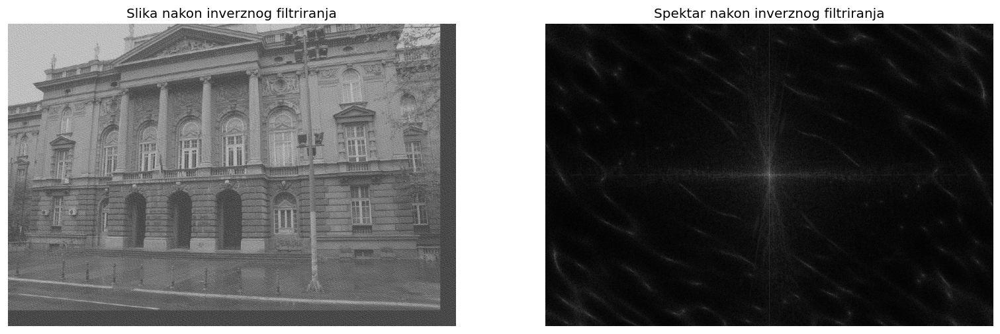

In [12]:
# Proces inverznog filtriranja
img_fft_est_filt = (img_fft/kernel_fft)
img_fft_est_filt = ifftshift(img_fft_est_filt)
img_fft_est_filt[0,0] = DC #Očuvanje srednje vrednosti slike
img_fft_est_filt = fftshift(img_fft_est_filt)
img_est_filt = real(ifft2(ifftshift(img_fft_est_filt)))
img_est_filt = np.clip(img_est_filt, 0, 1)

fig,axes = plt.subplots(nrows=1,ncols=2,figsize=(16,8),dpi=120)
ax = axes.ravel()

ax[0].imshow(img_est_filt,cmap='gray');ax[0].set_axis_off(); ax[0].set_title('Slika nakon inverznog filtriranja')
ax[1].imshow(log(1+abs(img_fft_est_filt)),cmap='gray');ax[1].set_axis_off(); ax[1].set_title('Spektar nakon inverznog filtriranja')

# Vinerov filtar
Do rešenja ovog problema može se doći pomoću Vinerovog filtra. On minimizuje srednju kvadratnu grešku koja nastaje usled inverznog filtriranja. Podešavanjem koeficijenta k može se uticati na jačinu filtriranja, što je k manje filtriranje je veće i bliže je inverznom,a sa povećanjek k filtriranje je manje ali se sprečava ekspodiranje pojedinih spektralnih komponenti.

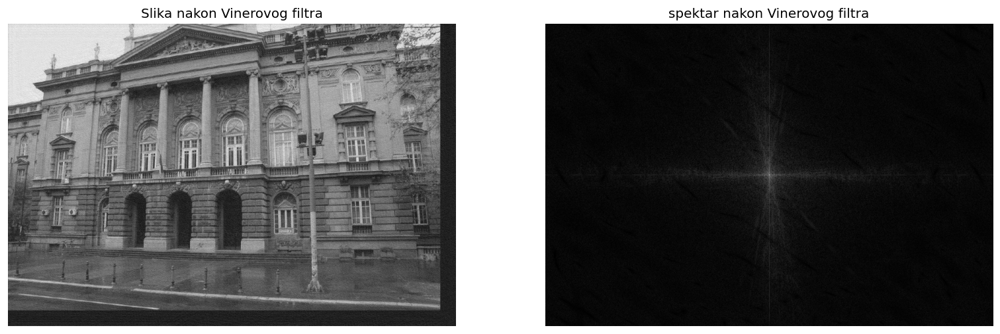

In [13]:
# Definisanje Vinerovog filtra i konstante k
k = 4
W = (abs(kernel_fft)**2)/(abs(kernel_fft)**2 + k)

img_fft_est = img_fft/kernel_fft*W
img_fft_est = ifftshift(img_fft_est)
img_fft_est[0,0] = DC # Očuvanje srednje vrednosti
img_fft_est = fftshift(img_fft_est)
img_est = real(ifft2(ifftshift(img_fft_est)))
img_est = np.clip(img_est, 0, 1)

fig,axes = plt.subplots(nrows=1,ncols=2,figsize=(16,8),dpi=120)
ax = axes.ravel()
ax[0].imshow(img_est,cmap='gray',);ax[0].set_axis_off(); ax[0].set_title('Slika nakon Vinerovog filtra');
ax[1].imshow(log(1+abs(img_fft_est)),cmap='gray');ax[1].set_axis_off(); ax[1].set_title('spektar nakon Vinerovog filtra');

# 4. Zadatak
U okviru ovog zadatka potrebno je uporediti brzinu filtriranja slike 
filtrima različitih dimenzija u prostornom i frekvencijskom domenu.
Realizovati dve funkcije kojima se obavlja filtriranje slike korišćenjem 
Gausovog filtra. Obe funkcije imaju identičan interefejs i primaju kao ulazne 
podatke: ulaznu sliku, radijus filtra, standardnu devijaciju Gausove funkcije. 
Izlaz funkcije je filtrirana slika. Unutar funkcije obezbediti odgovarajuće 
proširenje slike ponavljanjem ivičnih piksela. Isto proširenje sprovesti u obe 
realizacije.
Prva funkcija filter_gauss realizuje filtriranje u prostornom domenu. Potrebno 
je samostalno realizovati zadatu funkciju bez korišćenja gotovih Python
funkcija poput correlate i sl. Potrudite se da što efikasnije implementirate ovu 
funkciju i da iskoristite sve osobine, poput separabilnosti, simetričnosti i sl.
Druga funkcija filter_gauss_freq realizuje filtriranje Gausovim filtrom u 
prostonom domenu, s tim što se procesiranje obavlja u frekvencijskom 
domenu. Dakle, parametri filtra koji se zadaju u funkciji predstavljaju 
parametre prostornog filtra tako da isti parametri u obe funkcije treba da
proizvedu identičan rezultat. Ovo obavezno proveriti i prikazati u izveštaju.


# Frekvencijsko filtriranje

In [14]:
def filter_gaus_freq(img,D,sigma):
    # Opis funkcije
    # 
    # Ulazni parametri:
    # img - ulazna slika
    # D - radijus filtra
    # sigma - standardna devijacija gausove funkcije
    #
    # Iako se u ovoj funkciji radi mnozenje Furijeovih transformacija a ne konvolucija u prostornom domenu slika se dopunjava ivičnim pikselima po D sa svake strane,
    # da bi se izbegla redukcija dimenzije,potom se pravi maska dimenzija (2D+1)*(2D+1) koja se potom dopunjava nulama da bi bila iste dimenzije kao slika.
    # Zatim se radi Furijeova transformacija slike i maske, i njihov proizvod daje furijeovu transformaciju filtrirane slike
    # 
    
    img_pad = np.pad(img,(D,D),'reflect')
    img_fft =fft2(img_pad)
    DC = img_fft[0,0]
    img_fft = fftshift(img_fft)
    
    Nx = 2*D+1
    Ny = 2*D+1

    if (Ny%2 == 0): 
        y = np.arange(0,Ny) - Ny/2 + 0.5
    else:
        y = np.arange(0,Ny) - (Ny-1)/2
    
    if (Nx%2 == 0):
        x = np.arange(0,Nx) - Nx/2 + 0.5
    else:
        x = np.arange(0,Nx) - (Nx-1)/2
    
    X, Y = meshgrid(x, y)
    filter_mask = (1/(2*pi*(sigma**2)))*exp(-(np.square(X)+np.square(Y))/(2*sigma**2)) # Definisanje maske
    fil_mask_fft = fftshift(fft2(filter_mask))

    [Px,Py] = shape(img_pad)
    filter_mask_pad = np.zeros([Px,Py])
    filter_mask_pad[0:Nx,0:Ny] = filter_mask # Dopunjavanje maske nulama

    filter_mask_fft = fftshift(fft2(filter_mask_pad)) #Furijeova transformacija i centriranje spektra

    img_filt_fft = img_fft*filter_mask_fft
    img_filt_fft = ifftshift(img_filt_fft)
    img_filt_fft[0,0] = DC # Čuvanje srednje vrednosti
    img_filt = real(ifft2((img_filt_fft)))
    img_filt = np.clip(img_filt, 0, 1)
    
    img_filt = img_filt[2*D:,2*D:,] # Vraćanje na originalnu dimenziju slike
    return img_filt,fil_mask_fft,X,Y

    


# Prostorno filtriranje

In [15]:
def filter_gauss(img,D,sigma):
    # Opis funkcije
    # Ulazni parametri:
    # img - ulazna slika
    # D - radijus filtra
    # sigma - standardna devijacija gausove funkcije
    #
    # U prostornom domenu, potrebno je uraditi konvoluciju slike i maske i tako dobiti filtriranu sliku. Zbog separabilnosti i simetričnosti gausovog filtra moguće je umesto 2d konvolucije
    # uraditi 2 puta 1d konvoluciju i time višestruko ubrzati filtriranje. U ovoj funkciji je uradjena SVD dekompozicija i od 2d filtra dobijen je vektor kolona U koji služi za vertikalnu
    # konvoluciju i vektor vrsta V koji služi za horizontalnu konvoluciju. Da bih ubrzao izvršavanje i U i V su prošireni na dimenziju slike pa je dim(U)=(2D+1)*(širina slike),
    # a dim(V) = (visina slike)*(2D+1). Time je dobijeno da je za horizontalnu + vertikalnu konvoluciju, dovoljno iterirati samo širina+visina puta umesto širina*visina.
    #
    img_pad = np.pad(img,(D,D),'reflect')
    Nx = 2*D+1
    Ny = 2*D+1

    if (Ny%2 == 0): 
        y = np.arange(0,Ny) - Ny/2 + 0.5
    else:
        y = np.arange(0,Ny) - (Ny-1)/2
    
    if (Nx%2 == 0):
        x = np.arange(0,Nx) - Nx/2 + 0.5
    else:
        x = np.arange(0,Nx) - (Nx-1)/2

    X, Y = meshgrid(x, y)
    filter_mask = (1/(2*pi*(sigma**2)))*exp(-(np.square(X)+np.square(Y))/(2*sigma**2))
    
    U, E, V = np.linalg.svd(filter_mask) # SVD dekompozicija
    
    U = U[:,0]
   
    V = V[0,:]
    U = U*(-1)*sqrt(E[0])
    V = V*(-1)*sqrt(E[0])
    U = np.reshape(U,(shape(U)[0],1))
    
    V = np.reshape(V,(1,shape(V)[0]))
    
    V = np.pad(V,((0,shape(img_pad)[0]-1),(0,0)),'edge') # Proširenje vektora V
    
    U = np.pad(U,((0,0),(0,shape(img_pad)[1]-1)),'edge') # Proširenje vektora U
   
    img_out = np.zeros((shape(img_pad)[0],shape(img_pad)[1]))
    
    for i in range(0,shape(img_pad)[0]-2*D): # vertikalna konvolucija
        img_out[i,0:] = (U*img_pad[i:i+shape(U)[0],:]).sum(axis=0)

    for i in range(0,shape(img_pad)[1]-2*D): # horizontalna konvolucija
        img_out[0:,i] = (V*img_out[:,i:i+shape(V)[1]]).sum(axis=1)
    img_out = img_out[0:shape(img)[0],0:shape(img)[1]]
    
    return img_out,filter_mask,X,Y

   


# Upoređivanje rezultata

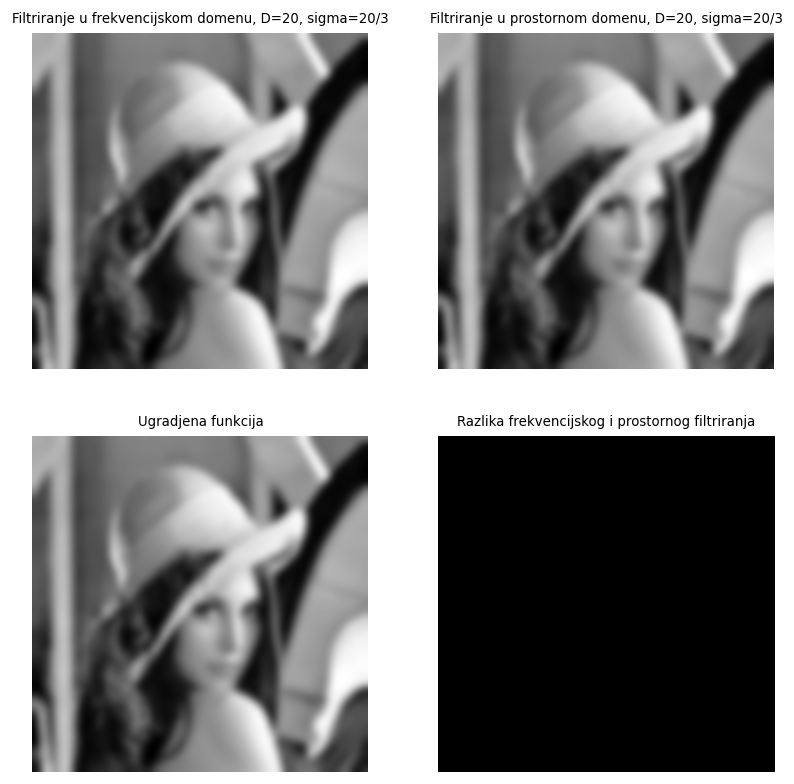

In [16]:
img = util.img_as_float(imread('sekvence/lena.tif'))
[frekv,frekv_filt,Xf,Yf]= filter_gaus_freq(img,20,20/3)
[prost,prost_filt,Xp,Yp] = filter_gauss(img,20,20/3)
razlika = abs(frekv-prost)

ugradjena = scipy.ndimage.gaussian_filter(img,sigma=20/3,radius=20)
fig,axes = plt.subplots(nrows=2,ncols=2,figsize=(8,8),dpi=120)
ax = axes.ravel()

ax[0].imshow(frekv,cmap='gray');ax[0].set_axis_off(); ax[0].set_title('Filtriranje u frekvencijskom domenu, D=20, sigma=20/3',fontsize=8);
ax[1].imshow(prost,cmap='gray');ax[1].set_axis_off(); ax[1].set_title('Filtriranje u prostornom domenu, D=20, sigma=20/3',fontsize=8);
ax[2].imshow(ugradjena,cmap='gray');ax[2].set_axis_off(); ax[2].set_title('Ugradjena funkcija',fontsize=8);
ax[3].imshow(razlika,cmap='gray',vmin=0,vmax=1);ax[3].set_axis_off(); ax[3].set_title('Razlika frekvencijskog i prostornog filtriranja',fontsize=8);

In [17]:
vreme_frekvencijski = []
vreme_prostorni = []
skg =[]
osa = np.arange(1,51,1)

vreme_ugradjene=[]
for i in range(1,51):
    start_frekv = time.time()
    frekvencijski = filter_gaus_freq(img,i,i/3)
    vreme_frekvencijski.append(time.time()-start_frekv)
    start_prost = time.time()
    prostorni = filter_gauss(img,i,i/3)
    vreme_prostorni.append(time.time()-start_prost)
    start_ugradjene = time.time()
    ugradjena = scipy.ndimage.gaussian_filter(img,sigma=i/3,radius=i)
    vreme_ugradjene.append(time.time()-start_ugradjene)



# Upoređivanje brzina izvršavanja

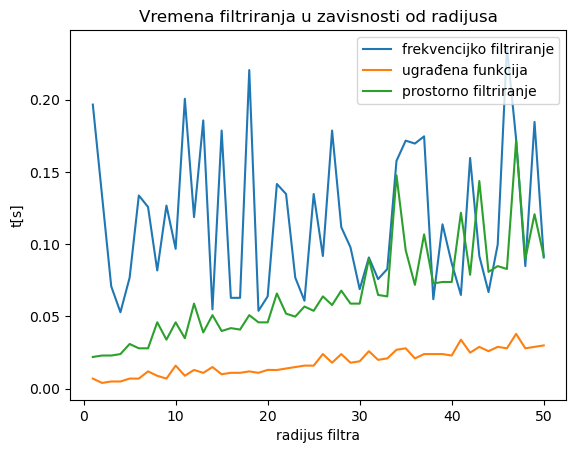

In [18]:
plt.figure(1)
plt.plot(osa,vreme_frekvencijski,label = 'frekvencijko filtriranje');
plt.plot(osa,vreme_ugradjene,label='ugrađena funkcija');
plt.plot(osa,vreme_prostorni,label = 'prostorno filtriranje');
plt.title('Vremena filtriranja u zavisnosti od radijusa');
plt.xlabel('radijus filtra');
plt.ylabel('t[s]');
plt.legend();


Text(0.5, 0.92, 'Filtar u prostornom domenu')

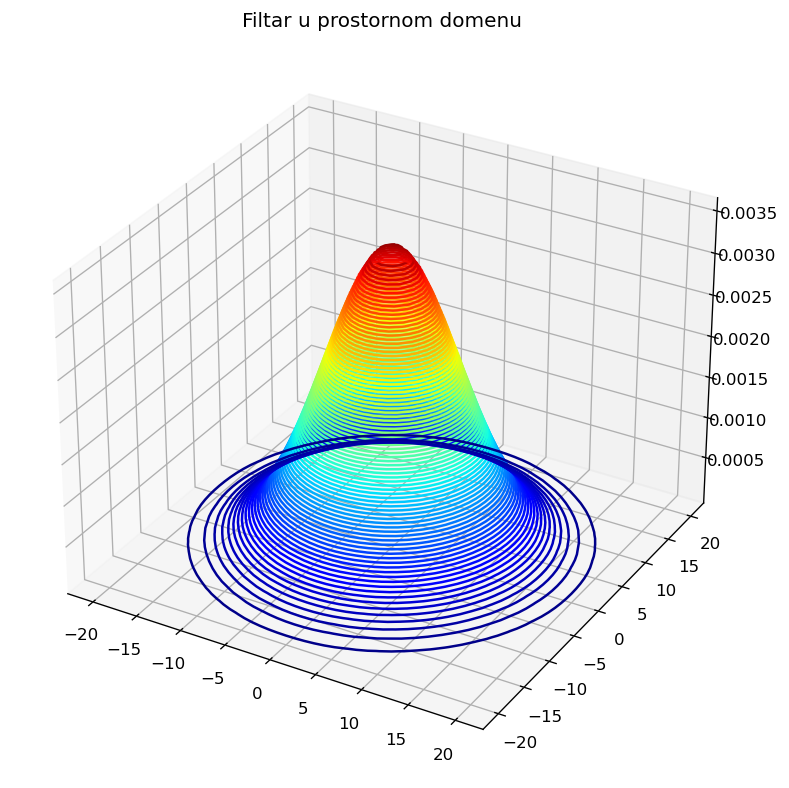

In [19]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(8,8), dpi=120)
ax = plt.axes(projection='3d')
ax.contour3D(Xp, Yp, abs(prost_filt), 100, cmap = 'jet');
ax.set_title('Filtar u prostornom domenu')

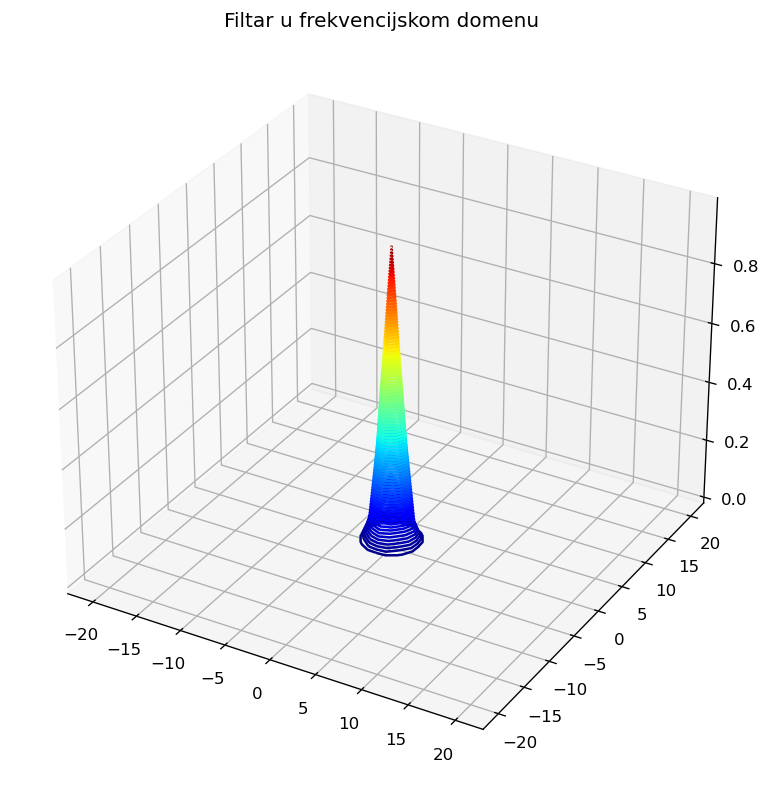

In [20]:
fig = plt.figure(figsize=(8,8), dpi=120)
ax = plt.axes(projection='3d')
ax.contour3D(Xf, Yf, abs(frekv_filt), 100, cmap = 'jet');
ax.set_title('Filtar u frekvencijskom domenu');

# Zaključak
Dok je dimenzija filtra manja prostorna konvolucija je brža i treba nju primenjivati. Kako se dimenzija filtra povećava povećava se i vreme za koje se konvolucija izvršava, dok trend frekvencijskog filtriranja ostaje isti, pa sa veoma velikim filtrima bolje je koristiti frekvencijsko filtriranje.